#**FOOD CLASSIFICATION USING INCEPTIONV3**

# Table of Contents



    *IMPORTING LIBRARIES

    *LOADING DATA

    *DATA PREPROCESSING

    *BUILDING MODEL

    *TRANSFER LEARNING USING INCEPTIONV3

    *PLOTTING MODEL TRAINING AND VALIDATION RESULT

    *SAVING MODEL

    *PREDICTION


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp '/content/drive/MyDrive/projects/food-101.zip' '/content'

In [ ]:
!mkdir foods25

In [ ]:
!unzip /content/drive/MyDrive/projects/food-101.zip -d "/content/foods25"

Streaming output truncated to the last 5000 lines.
  inflating: /content/foods25/food-101/images/spring_rolls/2137706.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/278587.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/1008736.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/215931.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/1190814.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/974975.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/1850373.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/237340.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/117282.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/710442.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/1901488.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/1679135.jpg  
  inflating: /content/foods25/food-101/images/spring_rolls/1067952.jpg  
  infl

# Importing Libraries

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model,Model

# Loading Data

In [ ]:
data_dir = '/content/foods25/food-101/images'
data = tf.keras.preprocessing.image_dataset_from_directory(data_dir)

Found 25000 files belonging to 25 classes.


In [ ]:
#Create an ImageDataGenerator and do Image Augmentation
datagen = ImageDataGenerator(
        rescale = 1./255,
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        validation_split = 0.2)

# image processing

In [ ]:
height = 228
width = 228
channels = 3
batch_size = 32
img_shape = (height, width, channels)
img_size = (height, width)


In [ ]:
train_data = datagen.flow_from_directory(
    data_dir,
    target_size = img_size,
    batch_size = batch_size,
    class_mode = 'categorical',
    subset = 'training')

val_data = datagen.flow_from_directory(
    data_dir,
    target_size = img_size,
    batch_size = batch_size,
    class_mode='categorical',
    subset = 'validation')


Found 20000 images belonging to 25 classes.
Found 5000 images belonging to 25 classes.


In [ ]:
num_classes = len(data.class_names)
print('.... Number of Classes : {0} ....'.format(num_classes))

.... Number of Classes : 25 ....


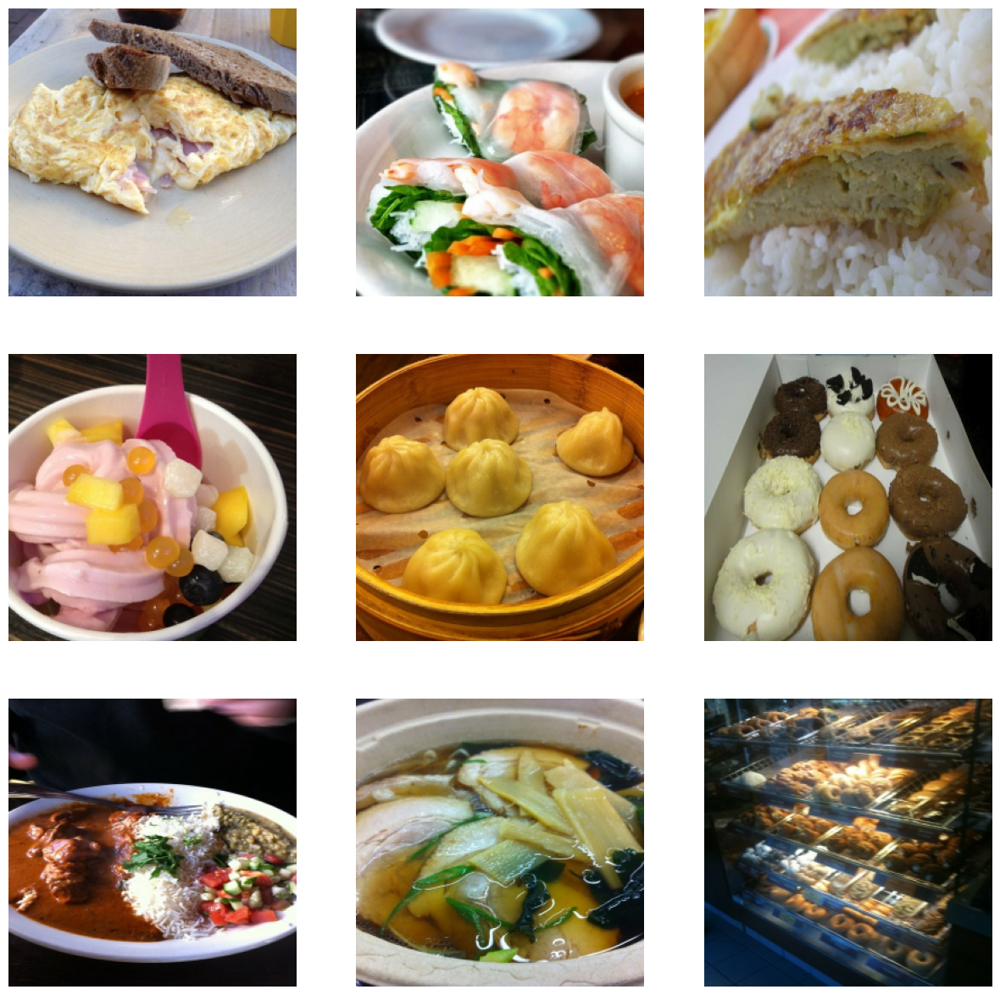

In [ ]:
#Defing a function to see images
def show_img(data):
    plt.figure(figsize=(15,15))
    for images, labels in data.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            ax.imshow(images[i].numpy().astype("uint8"))
            ax.axis("off")

#Plotting the images in dataset
show_img(data)

# Training Model

In [ ]:
# load pre-trained InceptionV3
pre_trained = InceptionV3(weights='imagenet', include_top=False, input_shape=img_shape, pooling='avg')

for layer in pre_trained.layers:
    layer.trainable = False

87910968/87910968 [==============================] - 0s 0us/step


In [ ]:
x = pre_trained.output
x = BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001)(x)
x = Dropout(0.2)(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.2)(x)
predictions = Dense(num_classes, activation='softmax')(x)

model = Model(inputs = pre_trained.input, outputs = predictions)
model.compile(optimizer = Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 228, 228, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 113, 113, 32)         864       ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 113, 113, 32)         96        ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 activation (Activation)     (None, 113, 113, 32)         0         ['batch_normalization[0][0

In [ ]:
# STEP_SIZE_TRAIN = train_data.n // train_data.batch_size
# STEP_SIZE_VALID = val_data.n // val_data.batch_size

# history = model.fit_generator(train_data,
#                     steps_per_epoch = STEP_SIZE_TRAIN,
#                     validation_data = val_data,
#                     validation_steps = STEP_SIZE_VALID,
#                     epochs = 25,
#                     verbose = 1)

<ipython-input-18-319c28e5c92b>:4: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_data,


Epoch 1/25
625/625 [==============================] - 386s 600ms/step - loss: 2.0253 - accuracy: 0.5294 - val_loss: 1.4284 - val_accuracy: 0.6170
Epoch 2/25
625/625 [==============================] - 368s 589ms/step - loss: 1.3516 - accuracy: 0.6121 - val_loss: 1.2203 - val_accuracy: 0.6456
Epoch 3/25
625/625 [==============================] - 369s 591ms/step - loss: 1.2118 - accuracy: 0.6439 - val_loss: 1.2091 - val_accuracy: 0.6583
Epoch 4/25
625/625 [==============================] - 359s 574ms/step - loss: 1.1782 - accuracy: 0.6503 - val_loss: 1.1926 - val_accuracy: 0.6583
Epoch 5/25
625/625 [==============================] - 370s 592ms/step - loss: 1.1244 - accuracy: 0.6645 - val_loss: 1.2228 - val_accuracy: 0.6450
Epoch 6/25
625/625 [==============================] - 366s 586ms/step - loss: 1.1095 - accuracy: 0.6718 - val_loss: 1.2125 - val_accuracy: 0.6573
Epoch 7/25
625/625 [==============================] - 366s 586ms/step - loss: 1.0847 - accuracy: 0.6772 - val_loss: 1.2085 -

# Model Saving

In [ ]:
# model_name = 'food_recognition.h5'
# model.save(model_name, save_format='h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


# Plotting Model Training And Validation Result

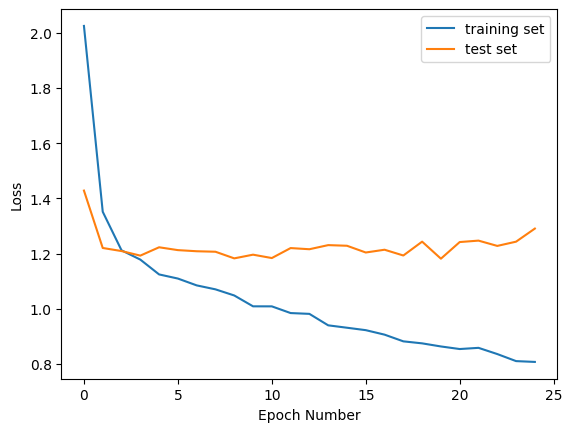

In [ ]:
# plt.xlabel('Epoch Number')
# plt.ylabel('Loss')
# plt.plot(history.history['loss'], label='training set')
# plt.plot(history.history['val_loss'], label='test set')
# plt.legend()

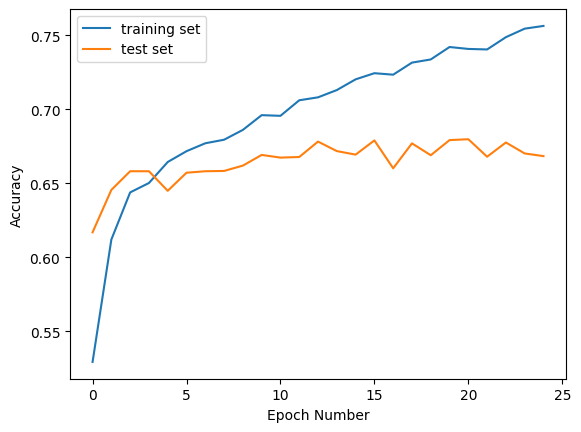

In [ ]:
# plt.xlabel('Epoch Number')

# plt.ylabel('Accuracy')
# plt.plot(history.history['accuracy'], label='training set')
# plt.plot(history.history['val_accuracy'], label='test set')
# plt.legend()

In [ ]:
!cp '/content/drive/MyDrive/food_recognition.h5' '/content'

In [ ]:
model = load_model('/content/food_recognition.h5')

# Prediction

In [ ]:
class_map = train_data.class_indices
classes = []
for key in class_map.keys():
    classes.append(key)

In [ ]:
def predict_image(filename, model):
    img_ = image.load_img(filename, target_size=(228, 228))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(str(classes[index]).title()), size=18, color='red')
    plt.imshow(img_array)

1/1 [==============================] - 4s 4s/step


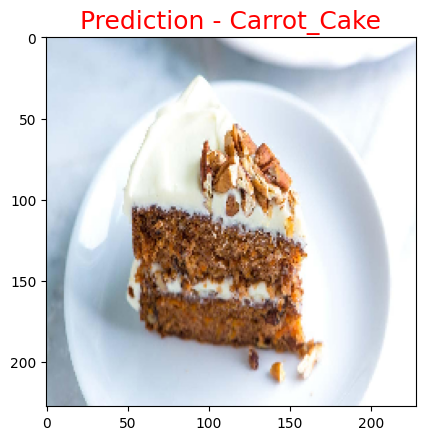

In [ ]:
predict_image('/content/carrot.jpg', model)

1/1 [==============================] - 0s 33ms/step


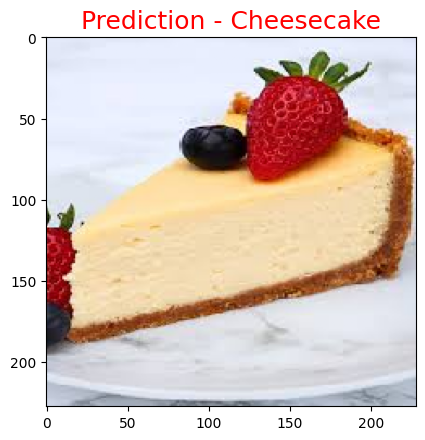

In [ ]:

predict_image('/content/chesssss.jpeg', model)

1/1 [==============================] - 0s 25ms/step


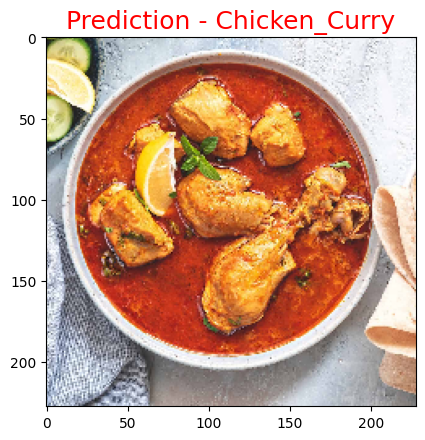

In [ ]:
predict_image('/content/Chicken-Curry.jpg', model)

1/1 [==============================] - 0s 26ms/step


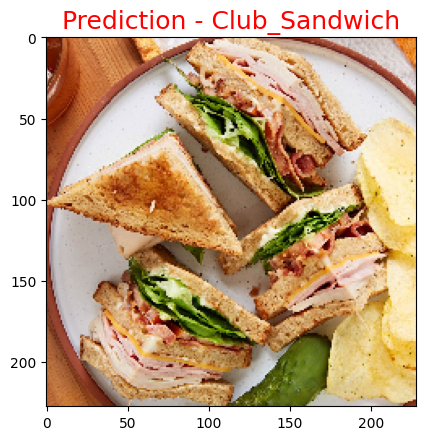

In [ ]:
predict_image('/content/club-sandwich.jpg', model)

1/1 [==============================] - 0s 46ms/step


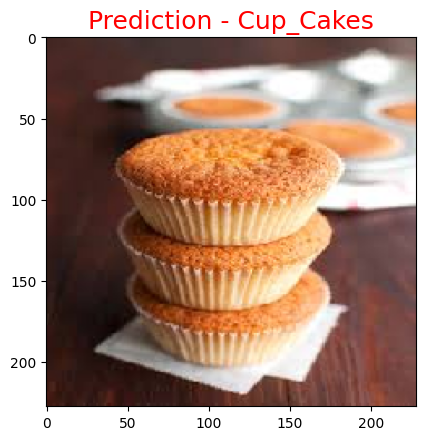

In [ ]:
predict_image('/content/cup cake.jpeg', model)

1/1 [==============================] - 0s 39ms/step


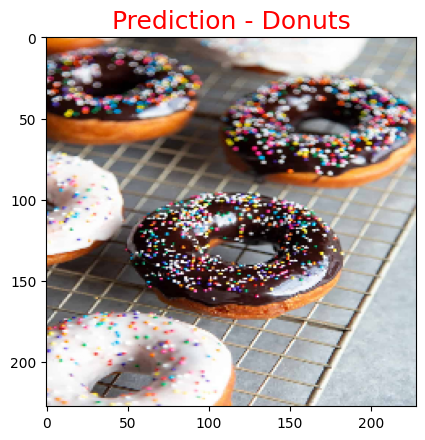

In [ ]:
predict_image('/content/Donuts.jpg', model)

1/1 [==============================] - 0s 49ms/step


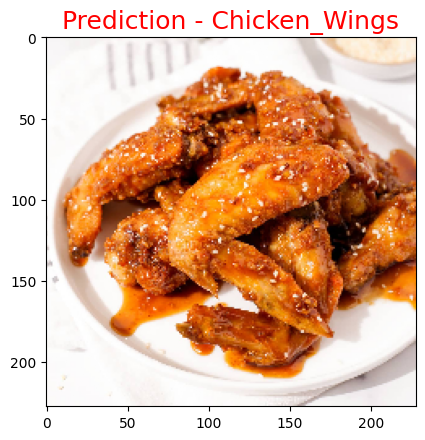

In [ ]:
predict_image('/content/chicken wings.jpg', model)

1/1 [==============================] - 0s 27ms/step


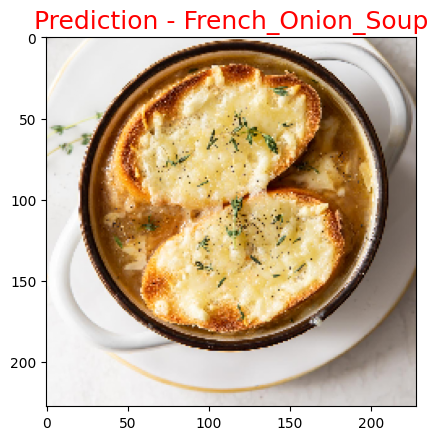

In [ ]:
predict_image('/content/French onion soup.jpg', model)

1/1 [==============================] - 0s 36ms/step


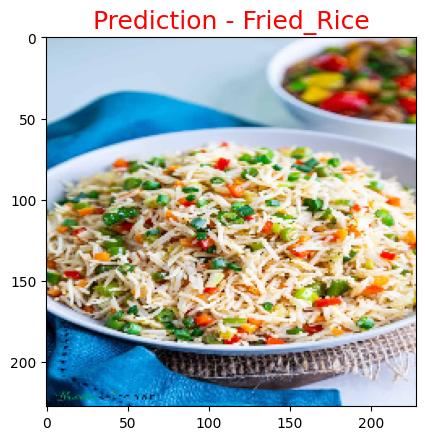

In [ ]:
predict_image('/content/Fried rice.jpg', model)

1/1 [==============================] - 0s 40ms/step


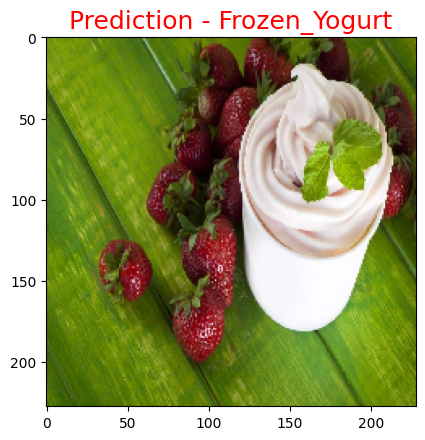

In [ ]:
predict_image('/content/yogurtsss.jpg', model)

1/1 [==============================] - 0s 25ms/step


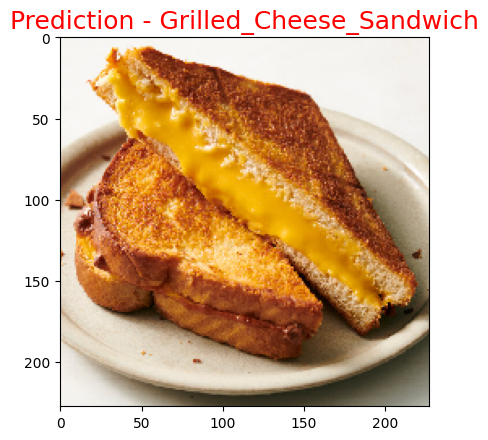

In [ ]:
predict_image('/content/Grilled cheese sandwich.jpg', model)

1/1 [==============================] - 0s 25ms/step


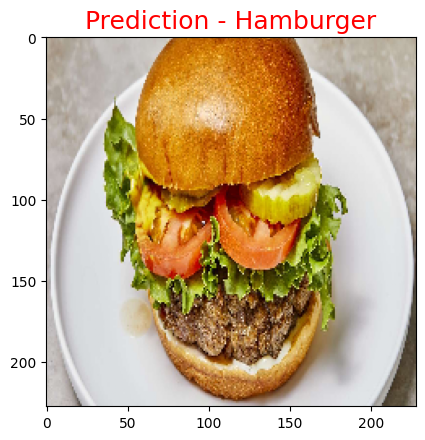

In [ ]:
predict_image('/content/Hamburger.jpg', model)

1/1 [==============================] - 0s 25ms/step


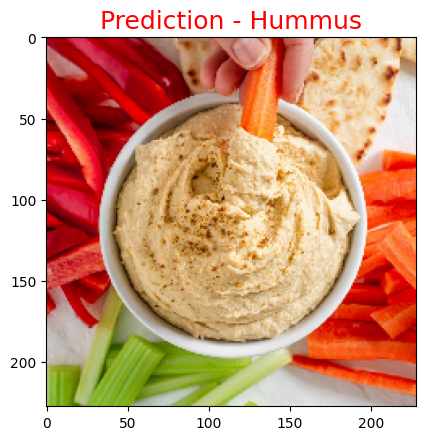

In [ ]:
predict_image('/content/Hummus.jpg', model)

1/1 [==============================] - 0s 25ms/step


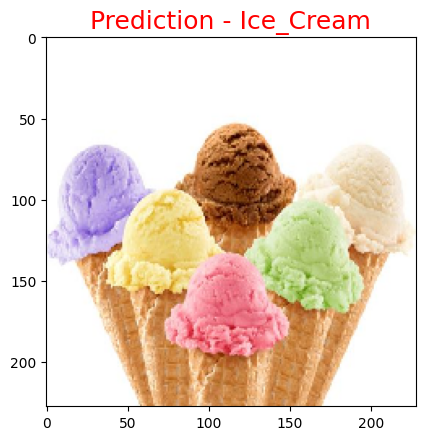

In [ ]:
predict_image('/content/Ice cream.jpg', model)

1/1 [==============================] - 0s 25ms/step


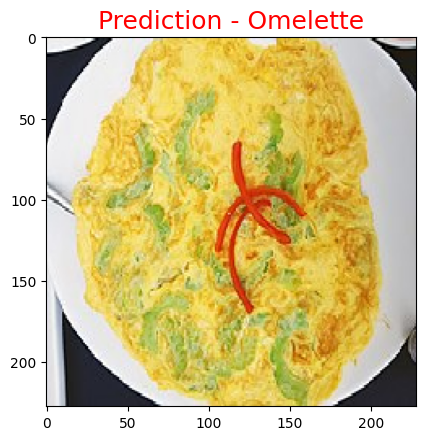

In [ ]:
predict_image('/content/omlettee.jpg', model)

1/1 [==============================] - 0s 26ms/step


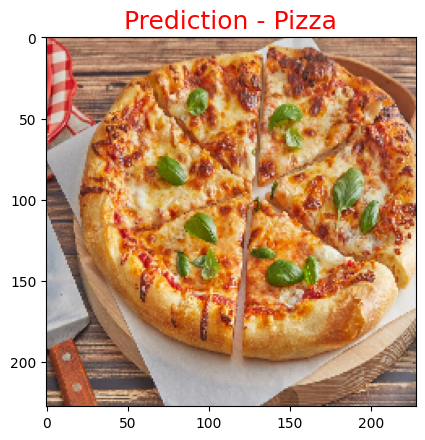

In [ ]:
predict_image('/content/Pizza.jpg', model)

1/1 [==============================] - 0s 48ms/step


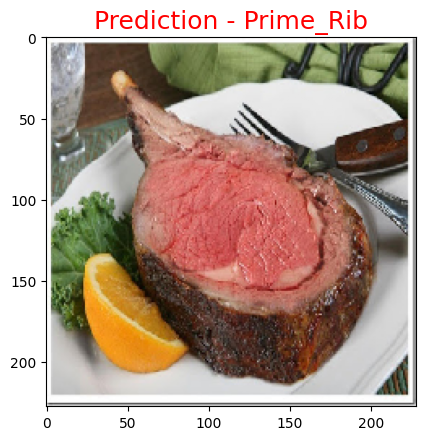

In [ ]:
predict_image('/content/prime rib.jpg', model)

1/1 [==============================] - 0s 25ms/step


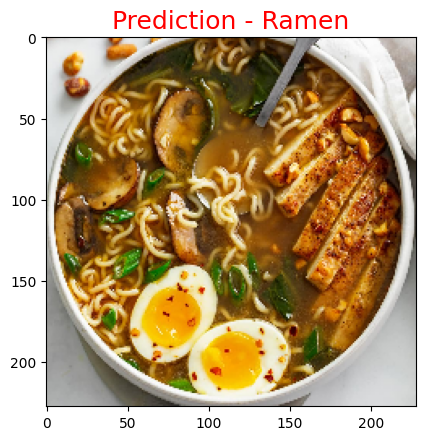

In [ ]:
predict_image('/content/Ramen.jpg', model)

1/1 [==============================] - 0s 32ms/step


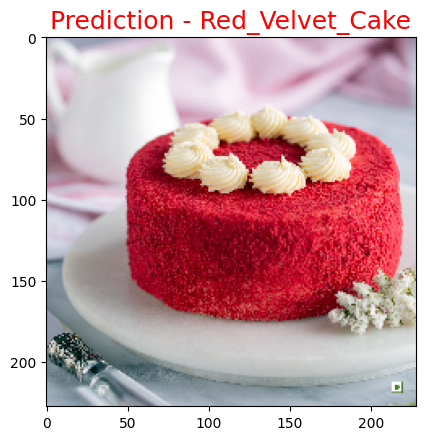

In [ ]:
predict_image('/content/Red velvet cake.jpg', model)

1/1 [==============================] - 0s 25ms/step


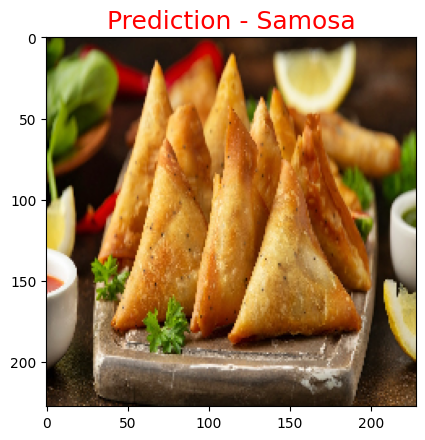

In [ ]:
predict_image('/content/Samosa.jpg', model)

1/1 [==============================] - 0s 30ms/step


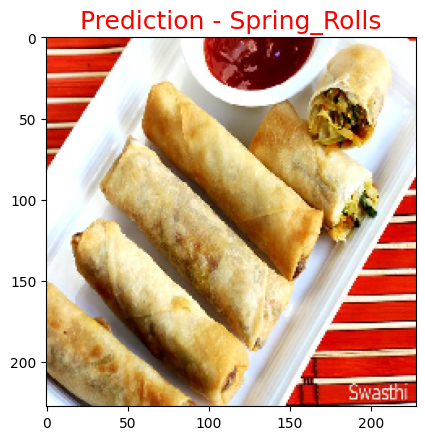

In [ ]:
predict_image('/content/Spring rolls.jpg', model)

1/1 [==============================] - 0s 48ms/step


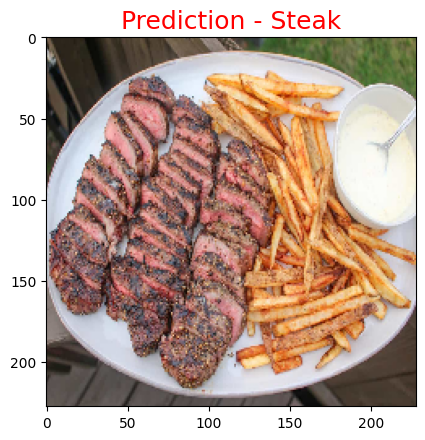

In [ ]:
predict_image('/content/steakkk.jpg', model)

1/1 [==============================] - 0s 25ms/step


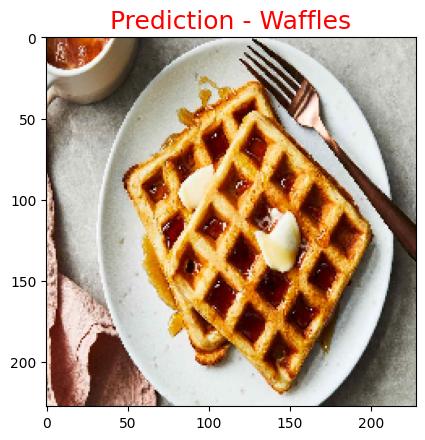

In [ ]:
predict_image('/content/Waffles.jpg', model)